In [1]:
import sys
sys.path.append('../')
import cv2
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageOps
import pytesseract


In [2]:
sys.path.append('yolo5')

In [3]:
from detect import *

In [4]:
img_name = '../src/Method 1_dataset/images/c_048.jpg'

In [5]:
img, line, crops, xywh, xyxy, c = detect(weights='yolo5/runs/train/best_model6/weights/best.pt',
                                   source=img_name,
                                  save_txt=True,
                                  save_crop=True,
                                  hide_labels=True,
                                  hide_conf=True,
                                  conf_thres=0.6)

YOLOv5 🚀 v5.0-192-g30e4c4f torch 1.8.1 CPU

Fusing layers... 
Model Summary: 476 layers, 87212152 parameters, 0 gradients, 217.1 GFLOPs


image 1/1 /Users/yeefan/Desktop/FYP/Algorithm/Experiment/Method 2/../src/Method 1_dataset/images/c_048.jpg: 384x640 6 handwrittens, 11 printeds, 1 others, Done. (1.647s)
Results saved to runs/detect/exp194
1 labels saved to runs/detect/exp194/labels
Done. (1.705s)


In [24]:
demo_img = cv2.imread(img_name)

In [25]:
import copy
crop_print = list()
crop_handwritten = list()
crop_print_pos = list()
crop_handwritten_pos = list()
imc = copy.deepcopy(demo_img)

for item, c_item in zip(xyxy,c):
#     plot_one_box(item, demo_img, color=colors(c_item, True),line_thickness=3)
    
    if c_item == 0:
        crop_handwritten.append(save_one_box(item, imc, file='crops/crops0/0.jpg', BGR=True))
        crop_handwritten_pos.append(item)
    elif c_item == 1:
        crop_print.append(save_one_box(item, imc, file='crops/crops1/1.jpg', BGR=True))
        crop_print_pos.append(item)
                    

In [26]:
len(crop_handwritten)

6

## Data Preprocessing

In [27]:
crop_handwritten_data = list()

for i in range(len(crop_handwritten)):
    gray_img = ImageOps.grayscale(Image.fromarray(crop_handwritten[i]))
    crop_handwritten_data.append(np.asarray(gray_img))

In [28]:
thumbnails = list()
for item in range(len(crop_handwritten)):
    img = Image.fromarray(crop_handwritten_data[item])
    img.thumbnail((375,30))
    thumbnails.append(np.asarray(img))

max_height = 118
width_max = 1500
a_temp = list()
b_temp = list()
final_processed = list()
for i in range(len(crop_handwritten)):
    trans_ratio = max_height/crop_handwritten[i].shape[0]
    trans_ratio = int(trans_ratio)
    if trans_ratio<1:
        width = crop_handwritten[i].shape[1]
        height = crop_handwritten[i].shape[0]
    else:
        width = crop_handwritten[i].shape[1]*trans_ratio
        height = max_height
    
    image = Image.fromarray(crop_handwritten[i])
    image_resized = image.resize((width,height))
    a_temp.append(np.asarray(image_resized))
    
for i in range(len(a_temp)):
    current_width = np.asarray(a_temp[i]).shape[1]
    gap = width_max - current_width
    im = Image.fromarray(a_temp[i])
    im_new = add_padding(im, 0, gap, 0, 0, (255, 255, 255))
    b_temp.append(np.asarray(im_new))
    
for i in range(len(b_temp)):
    width = 375
    height = 30
    width = int(width)
    height = int(height)
    image = Image.fromarray(b_temp[i])
    image_resized = image.resize((width,height))
    final_processed.append(np.asarray(image_resized))

resized_crop_handwritten = list()
max_height = 30

for i in range(len(crop_handwritten_data)):
    trans_ratio = max_height/crop_handwritten_data[i].shape[0]
    trans_ratio = int(trans_ratio)
    if trans_ratio<1:
        width = crop_handwritten_data[i].shape[1]
        height = crop_handwritten[i].shape[0]
    else:
        width = crop_handwritten_data[i].shape[1]*trans_ratio
        height = max_height
    
    image = Image.fromarray(crop_handwritten_data[i])
    image_resized = image.resize((width,height))
    resized_crop_handwritten.append(np.asarray(image_resized))

In [11]:
def add_padding(img,top,right,bottom,left,color):
    width = np.asarray(img).shape[1]
    height = np.asarray(img).shape[0]
    new_width = width+right+left
    new_height = height+top+bottom
    new_img = Image.new('L',(new_width,new_height),255)
    new_img.paste(img,(left,top))
    return new_img

In [29]:
width_max = 375
final_crop_handwritten = list()
for i in range(len(thumbnails)):
    current_width = thumbnails[i].shape[1]
    gap = width_max - current_width
    im = Image.fromarray(thumbnails[i])
    im_new = add_padding(im, 0, gap, 0, 0, color=(255,255,255))
    final_crop_handwritten.append(np.asarray(im_new))

In [30]:
data = list()
for item in final_crop_handwritten:
    img = copy.deepcopy(item)
    data.append(cv2.resize(img,(375,30)))

In [31]:
data = np.asarray(data)

In [32]:
data = np.expand_dims(data,axis=0)

data = data.reshape(-1,30,375,1)

## Word Recognition (Handwritten)

In [16]:
import torchvision.transforms as T
sys.path.append('../utils')
from transformer import *

Using TensorFlow backend.


In [17]:
input_size = (30, 375, 3)
max_text_length = 64
charset_base = string.printable[:95]
transform = T.Compose([
    T.ToTensor()])
tokenizer = Tokenizer(charset_base,64)
device = torch.device("cpu")
model = make_model(vocab_len=tokenizer.vocab_size)
_=model.to(device)
model.load_state_dict(torch.load('runs_pytorch_rec/modelA/torch_model.hdf5'))

<All keys matched successfully>

In [33]:
test_img = list()

for item in data:
    test_img.append(np.asarray(item.reshape(30,375)))
    
test_orig_txt = list()
for i in range(len(data)):
    test_orig_txt.append('')

In [34]:
test_loader = DataLoader(Dataset(test_img, test_orig_txt, transform), batch_size=1, shuffle=False, num_workers=0)
predicts, gt, imgs = test(model, test_loader, max_text_length, tokenizer, device)
predicts = list(map(lambda x : x.replace('SOS','').replace('EOS',''),predicts))
gt = list(map(lambda x : x.replace('SOS','').replace('EOS',''),gt))

In [21]:
c_img = list()
for i in imgs:
    img = i.permute(1,2,0).cpu().numpy().astype(np.uint8) 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    c_img.append(img)

In [22]:
predicts_p = list()
ii = list()
for item in crop_print:
    img = Image.fromarray(item)
    img = np.asarray(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 5, 20)
    ii.append(img)
    predicts_p.append(pytesseract.image_to_string(np.asarray(img)))

In [23]:
handwritten_predicts = predicts
printed_predicts = [item[:-2] for item in predicts_p]

In [24]:
handwritten_predicts

[' - ', '200', 'Zai Xan', '4 / 10 / 2017', 'Tan Yong Zhu', 'X - Ray']

In [25]:
Image.fromarray(c_img[4])

## Information Classification


In [13]:
import spacy
import tqdm
from spacy.training import Example

nlp1 = spacy.load(R"../ner/output/model-best")

# for i in range(len(handwritten_predicts)):
#     doc = nlp1(handwritten_predicts[i]) 
#     spacy.displacy.render(doc, style="ent", jupyter=True) 

# for i in range(len(printed_predicts)):
#     doc = nlp1(printed_predicts[i]) 
#     spacy.displacy.render(doc, style="ent", jupyter=True) 


['date','medicine','payment','clinic_name','address','contact','website','receipt_number','name','email','service']

In [27]:
classified_handwritten = list()
classified_printed = list()

for item in handwritten_predicts:
    doc = nlp1(item)
    entities=[(i, i.label_, i.label) for i in doc.ents]
    classified_handwritten.append(entities)
    
for item in printed_predicts:
    doc = nlp1(item)
    entities=[(i, i.label_, i.label) for i in doc.ents]
    classified_printed.append(entities)  
    

In [28]:
d = dict()

for item in classified_handwritten:
    if len(item) != 0:
        information = item[0][0]
        group = item[0][1]
        if str(group) == str('contact'):
            group = 'contact_patient'
        
        if str(group) == str('address'):
            group = 'address_patient'
        d[group] = []
        
for item in classified_handwritten:
    if len(item) != 0:
        information = item[0][0]
        group = item[0][1]
        if str(group) == str('contact'):
            group = 'contact_patient'
        
        if str(group) == str('address'):
            group = 'address_patient'
        d[group].append(information)
        
for item in classified_printed:
    if len(item) != 0:
        information = item[0][0]
        group = item[0][1]
        if str(group) == str('contact'):
            group = 'contact_clinic'
        
        if str(group) == str('address'):
            group = 'address_clinic'
        
        d[group] = []
        
for item in classified_printed:
    if len(item) != 0:
        information = item[0][0]
        group = item[0][1]
        if str(group) == str('contact'):
            group = 'contact_clinic'
        
        if group == 'address':
            group = 'address_clinic'
        
        d[group].append(information)

In [29]:
d

{'name': [Zai Xan, Tan Yong Zhu],
 'date': [4 / 10 / 2017],
 'service': [X - Ray],
 'address_clinic': [5, Jalan Anggerik, Taman Rekamas,, 75450, Ayer Keroh],
 'contact_clinic': [07-7235585],
 'clinic_name': [KLINIK ABC]}

## Image annotation

In [16]:
# shape = imc.shape[:2]
# blank = np.zeros([shape[0]+40,shape[1]+40,3],dtype=np.uint8)
# blank.fill(250)

def plot_handwritten_printed_boxes(img,x,text,color=(128,128,128),line_thickness=3):
    tl = line_thickness
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(img, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    cv2.putText(img, text, (c1[0], c1[1]+20), 0, tl / 5, 
                [0, 0, 0], thickness=1, lineType=cv2.LINE_AA)
    
    return img

def plot_group(img,x,group,color=(128,128,128),line_thickness=3):
    tl = line_thickness
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    txt_size = cv2.getTextSize(group,fontFace=0,fontScale=tl / 8,thickness=1)
    cv2.putText(img, group, (c1[0]-txt_size[0][0]-2, c1[1]+8), 0, tl / 8, 
                [0, 0, 0], thickness=1, lineType=cv2.LINE_AA)
    
    return img

In [31]:
shape = imc.shape[:2]
blank = np.zeros([shape[0]+40,shape[1]+40,3],dtype=np.uint8)
blank.fill(250)

i, j =0, 0
for item, c_item in zip(xyxy,c):    
    if c_item == 0:
        text = handwritten_predicts[i]
        i+=1
        if '\n' in text:
            text = text.replace('\n','')
        
        if '/' in text:
            text = text.replace('/ ','/')
            text = text.replace(' /','/')
        plot_handwritten_printed_boxes(blank,item,text,color=colors(c_item+75,True))
        group = nlp1(text)
        entities=[(i, i.label_, i.label) for i in group.ents]
        if entities:
            plot_group(blank,item,str(entities[0][1]),color=colors(c_item,True))
    
    elif c_item == 1:
        text = printed_predicts[j]
        j+=1
        if '\n' in text:
            text = text.replace('\n','')
        if '“' in text:
            text = text.replace('“','')
        plot_handwritten_printed_boxes(blank,item,text,color=colors(c_item+20,True))
        group = nlp1(text)
        entities=[(i, i.label_, i.label) for i in group.ents]
        if entities:
            plot_group(blank,item,str(entities[0][1]),color=colors(c_item,True))
        
    elif c_item == 2:
        plot_handwritten_printed_boxes(blank,item,'Logo / Signature',color=colors(c_item+188,True))
    

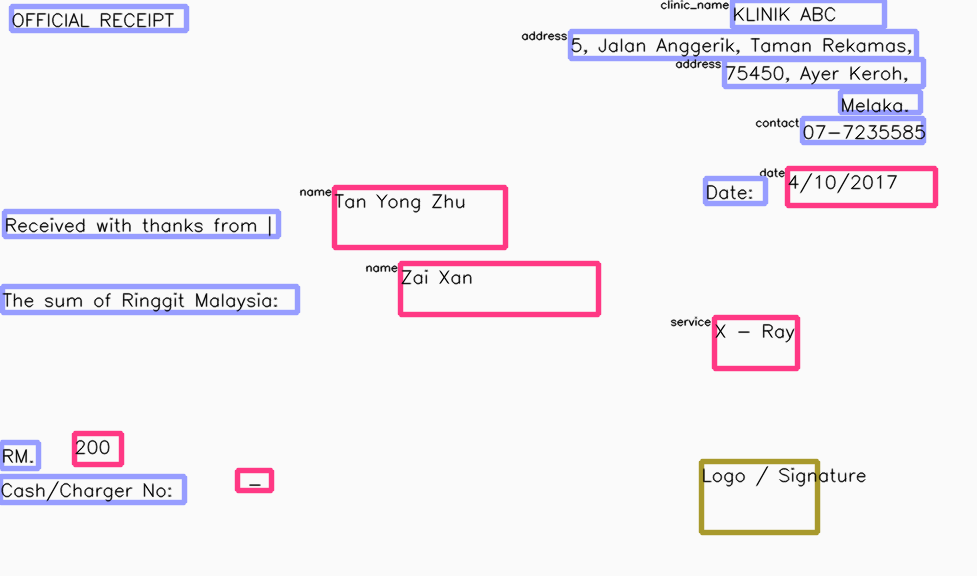

In [32]:
Image.fromarray(blank)

## Demo Function

In [7]:
def mergeDict(dict1, dict2):
    dict3 = {**dict1, **dict2}
    for key, value in dict3.items():
        if key in dict1 and key in dict2:
            dict3[key] = [value , dict1[key]]
    return dict3

In [8]:
def demo(img_name):
    img, line, crops, xywh, xyxy, c = detect(weights='yolo5/runs/train/best_model6/weights/best.pt',
                                   source=img_name,
                                  save_txt=True,
                                  save_crop=True,
                                  hide_labels=True,
                                  hide_conf=True,
                                  conf_thres=0.6)
    demo_img = cv2.imread(img_name)

    import copy
    crop_print = list()
    crop_handwritten = list()
    crop_print_pos = list()
    crop_handwritten_pos = list()
    imc = copy.deepcopy(demo_img)

    for item, c_item in zip(xyxy,c):
    #     plot_one_box(item, demo_img, color=colors(c_item, True),line_thickness=3)

        if c_item == 0:
            crop_handwritten.append(save_one_box(item, imc, file='crops/crops0/0.jpg', BGR=True))
            crop_handwritten_pos.append(item)
        elif c_item == 1:
            crop_print.append(save_one_box(item, imc, file='crops/crops1/1.jpg', BGR=True))
            crop_print_pos.append(item)
    
    crop_handwritten_data = list()

    for i in range(len(crop_handwritten)):
        gray_img = ImageOps.grayscale(Image.fromarray(crop_handwritten[i]))
        crop_handwritten_data.append(np.asarray(gray_img))

    thumbnails = list()
    for item in range(len(crop_handwritten)):
        img = Image.fromarray(crop_handwritten_data[item])
        img.thumbnail((375,30))
        thumbnails.append(np.asarray(img))
        
    width_max = 375
    final_crop_handwritten = list()
    for i in range(len(thumbnails)):
        current_width = thumbnails[i].shape[1]
        gap = width_max - current_width
        im = Image.fromarray(thumbnails[i])
        im_new = add_padding(im, 0, gap, 0, 0, color=(255,255,255))
        final_crop_handwritten.append(np.asarray(im_new))

    data = list()
    for item in final_crop_handwritten:
        img = copy.deepcopy(item)
        data.append(cv2.resize(img,(375,30)))

    data = np.asarray(data)

    data = np.expand_dims(data,axis=0)

    data = data.reshape(-1,30,375,1)
    

    input_size = (30, 375, 3)
    max_text_length = 64
    charset_base = string.printable[:95]
    transform = T.Compose([
        T.ToTensor()])
    tokenizer = Tokenizer(charset_base,64)
    device = torch.device("cpu")
    model = make_model(vocab_len=tokenizer.vocab_size, hidden_dim=256)
    _=model.to(device)
    model.load_state_dict(torch.load('runs_pytorch_rec/modelA/torch_model.hdf5'))

    test_img = list()

    for item in data:
        test_img.append(np.asarray(item.reshape(30,375)))

    test_orig_txt = list()
    for i in range(len(data)):
        test_orig_txt.append('')

    test_loader = DataLoader(Dataset(test_img, test_orig_txt, transform), batch_size=1, shuffle=False, num_workers=0)
    predicts, gt, imgs = test(model, test_loader, max_text_length, tokenizer, device)
    predicts = list(map(lambda x : x.replace('SOS','').replace('EOS',''),predicts))
    gt = list(map(lambda x : x.replace('SOS','').replace('EOS',''),gt))

    c_img = list()
    for i in imgs:
        img = i.permute(1,2,0).cpu().numpy().astype(np.uint8) 
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        c_img.append(img)

    predicts_p = list()
    ii = list()
    for item in crop_print:
        img = Image.fromarray(item)
        img = np.asarray(img)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 5, 20)
        ii.append(img)
        predicts_p.append(pytesseract.image_to_string(np.asarray(img)))

    handwritten_predicts = predicts
    printed_predicts = [item[:-2] for item in predicts_p]


    nlp1 = spacy.load(R"../ner/output/model-best")
    
    d = dict()
    e = dict()
    
    classified_handwritten = list()
    classified_printed = list()

    for item in handwritten_predicts:
        if '\n' in item:
            item = item.replace('\n','')
        
        if '/' in item:
            item = item.replace('/ ','/')
            item = item.replace(' /','/')
            
        if '@' in item:
            item = item.replace(' @ ','@')
            item = item.replace(' @','@')
            item = item.replace('@ ','@')
            
        if '.' in item:
            item = item.replace(' . ','.')
            item = item.replace(' .','.')
            item = item.replace('. ','.')
            
        if '‘' in item:
            item = item.replace(' ‘ ','‘')
            item = item.replace(' ‘','‘')
            item = item.replace('‘ ','‘')
            
        doc = nlp1(item)
        entities=[(i, i.label_, i.label) for i in doc.ents]
        classified_handwritten.append(entities)

    for item in printed_predicts:
        if '\n' in item:
            item = item.replace('\n','')
        
        if '/' in item:
            item = item.replace('/ ','/')
            item = item.replace(' /','/')
            
        if '‘' in item:
            item = item.replace(' ‘ ','‘')
            item = item.replace(' ‘','‘')
            item = item.replace('‘ ','‘')
            
        doc = nlp1(item)
        entities=[(i, i.label_, i.label) for i in doc.ents]
        classified_printed.append(entities)  
    
    for item in classified_handwritten:
        if len(item) != 0:
            information = item[0][0]
            group = item[0][1]
            if str(group) == str('contact'):
                group = 'contact_patient'

            if str(group) == str('address'):
                group = 'address_patient'
            d[group] = []

    for item in classified_handwritten:
        if len(item) != 0:
            information = item[0][0]
            group = item[0][1]
            if str(group) == str('contact'):
                group = 'contact_patient'

            if str(group) == str('address'):
                group = 'address_patient'
            d[group].append(information)

    for item in classified_printed:
        if len(item) != 0:
            information = item[0][0]
            group = item[0][1]
            if str(group) == str('contact'):
                group = 'contact_clinic'

            if str(group) == str('address'):
                group = 'address_clinic'

            e[group] = []

    for item in classified_printed:
        if len(item) != 0:
            information = item[0][0]
            group = item[0][1]
            if str(group) == str('contact'):
                group = 'contact_clinic'

            if group == str('address'):
                group = 'address_clinic'
            
            e[group].append(information)
        
    dict3 = mergeDict(d, e)  
    
    shape = imc.shape[:2]
    blank = np.zeros([shape[0]+40,shape[1]+40,3],dtype=np.uint8)
    blank.fill(250)
    im = blank
    i, j =0, 0
    for item, c_item in zip(xyxy,c):

        if c_item == 0:
            text = handwritten_predicts[i]
            i+=1
            im = plot_handwritten_printed_boxes(im,item,text,color=colors(c_item,True))
            group = nlp1(text)
            entities=[(i, i.label_, i.label) for i in group.ents]
            if entities:
                im = plot_group(im,item,str(entities[0][1]),color=colors(c_item,True))

        elif c_item == 1:
            text = printed_predicts[j]
            j+=1
            im = plot_handwritten_printed_boxes(im,item,text,color=colors(c_item,True))
            group = nlp1(text)
            entities=[(i, i.label_, i.label) for i in group.ents]
            if entities:
                im = plot_group(im,item,str(entities[0][1]),color=colors(c_item,True))

        elif c_item == 2:
            im = plot_handwritten_printed_boxes(im,item,'Logo / Signature',color=colors(c_item,True))
        
        
        
        return imc, dict3, xyxy, c, handwritten_predicts,printed_predicts

In [9]:
import string

In [ ]:
img_name = 'test.png'
ori_img, classified_info, xyxy, c, handwritten_predicts,printed_predicts = demo(img_name)


In [ ]:
shape = ori_img.shape[:2]
blank = np.zeros([shape[0]+140,shape[1]+140,3],dtype=np.uint8)
blank.fill(250)

i, j =0, 0
for item, c_item in zip(xyxy,c):    
    if c_item == 0:
        text = handwritten_predicts[i]
        i+=1
        if '\n' in text:
            text = text.replace('\n','')
        
        if '/' in text:
            text = text.replace('/ ','/')
            text = text.replace(' /','/')
            
        if '@' in text:
            text = text.replace(' @ ','@')
            text = text.replace(' @','@')
            text = text.replace('@ ','@')
            
        if '.' in text:
            text = text.replace(' . ','.')
            text = text.replace(' .','.')
            text = text.replace('. ','.')
            
        if '‘' in text:
            text = text.replace(' ‘ ','‘')
            text = text.replace(' ‘','‘')
            text = text.replace('‘ ','‘')
            
        plot_handwritten_printed_boxes(blank,item,text,color=colors(c_item+75,True))
        group = nlp1(text)
        entities=[(i, i.label_, i.label) for i in group.ents]
        if entities:
            plot_group(blank,item,str(entities[0][1]),color=colors(c_item,True))
    
    elif c_item == 1:
        text = printed_predicts[j]
        j+=1
        if '\n' in text:
            text = text.replace('\n','')
        if '“' in text:
            text = text.replace('“','')
        if '‘' in text:
            text = text.replace('‘','')
        plot_handwritten_printed_boxes(blank,item,text,color=colors(c_item+20,True))
        group = nlp1(text)
        entities=[(i, i.label_, i.label) for i in group.ents]
        if entities:
            plot_group(blank,item,str(entities[0][1]),color=colors(c_item,True))
        
    elif c_item == 2:
        plot_handwritten_printed_boxes(blank,item,'Logo / Signature',color=colors(c_item+188,True))
    

In [19]:
h, w = blank.shape[0:2]
bottom_right = (w-20,h-10)
bottom_corner = (w-200,h-80)
a = cv2.rectangle(blank, bottom_corner, bottom_right, color=(204,255,255), thickness=-1, lineType=cv2.LINE_AA)
b = cv2.putText(a, 'Handwritten', (bottom_corner[0]+20,bottom_corner[1]+20), 0, 1/3, 
                color=(0,0,0), thickness=1, lineType=cv2.LINE_AA)
cc = cv2.putText(b, 'Printed', (bottom_corner[0]+20,bottom_corner[1]+40), 0, 1/3, 
                color=(0,0,0), thickness=1, lineType=cv2.LINE_AA)
d = cv2.putText(cc, 'Others', (bottom_corner[0]+20,bottom_corner[1]+60), 0, 1/3, 
                color=(0,0,0), thickness=1, lineType=cv2.LINE_AA)
e = cv2.line(d, (bottom_corner[0]+110,bottom_corner[1]+17), (bottom_corner[0]+150,bottom_corner[1]+17), 
             color=colors(75,True), thickness=5)
f = cv2.line(e, (bottom_corner[0]+110,bottom_corner[1]+37), (bottom_corner[0]+150,bottom_corner[1]+37), 
             color=colors(1+20,True), thickness=5)
g = cv2.line(f, (bottom_corner[0]+110,bottom_corner[1]+57), (bottom_corner[0]+150,bottom_corner[1]+57), 
             color=colors(2+188,True), thickness=5)

In [ ]:
%matplotlib inline

imgs = [ori_img,blank]

fig = plt.figure(figsize=(24,16), constrained_layout=True)

for i in range(2):
    fig.add_subplot(1,2,i+1)
    plt.imshow(imgs[i], interpolation='nearest')
    ax = plt.gca()
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
plt.subplots_adjust(wspace = 0.0001)
# fig.tight_layout()
plt.show()

In [40]:
classified_info

{'address_patient': [4 , Jalan Cendawan , Taman Rinting,
  Taman Setia Indah.,
  41 , Jalan Angkasa ,],
 'website': [www.Regencyhospital.com],
 'contact_patient': [03 - 2211 7788],
 'date': [25/2/2020, 16/2/2020],
 'payment': [27.66, 130.00, 922.00, 949.66, 11.00, 780.00],
 'name': [[Haspital Ne.],
  [Ho Xin Yi, Dr.Koh, Valganciclovir, Peginterferon Alpha - 2A]],
 'medicine': [Med]}

## Samples

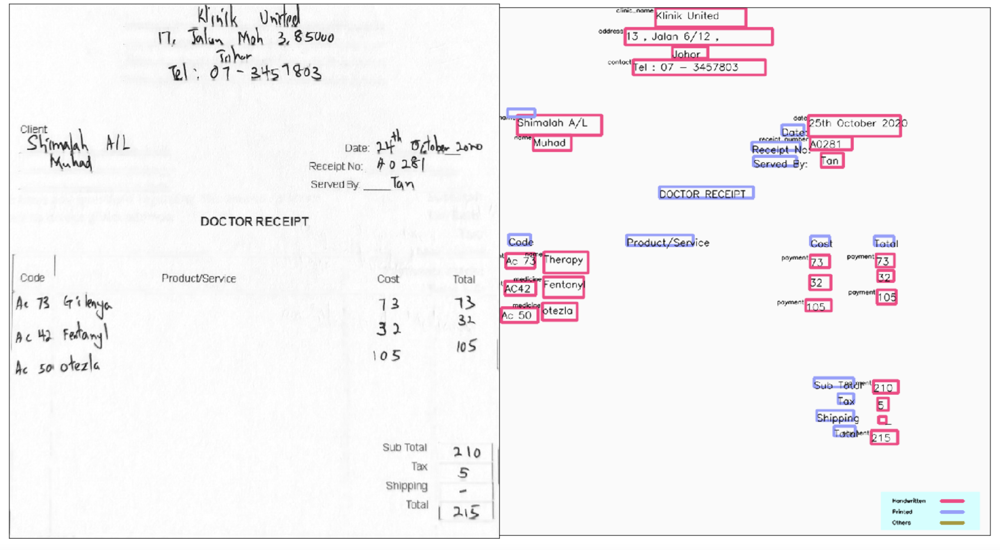

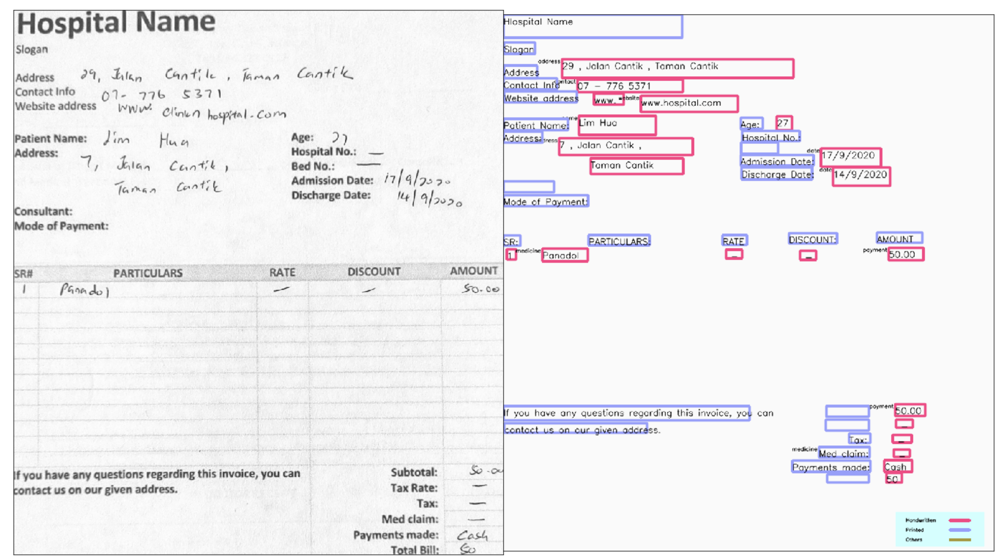

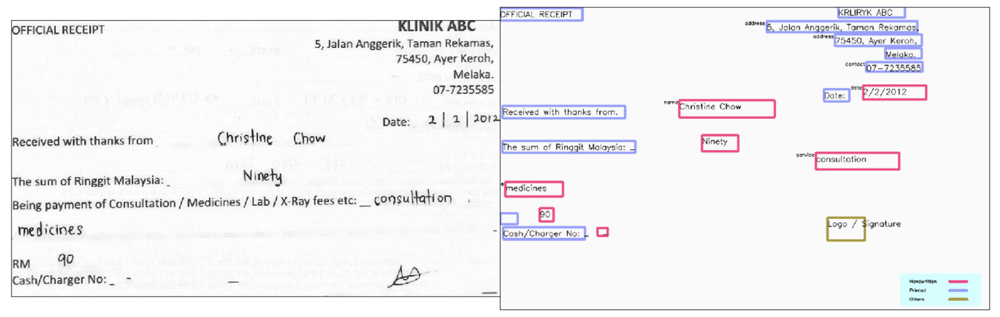

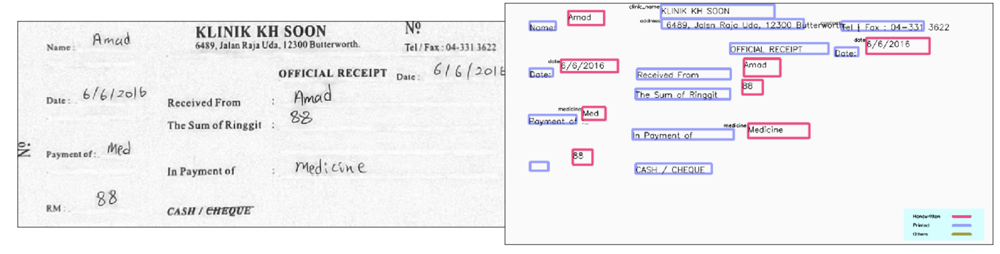

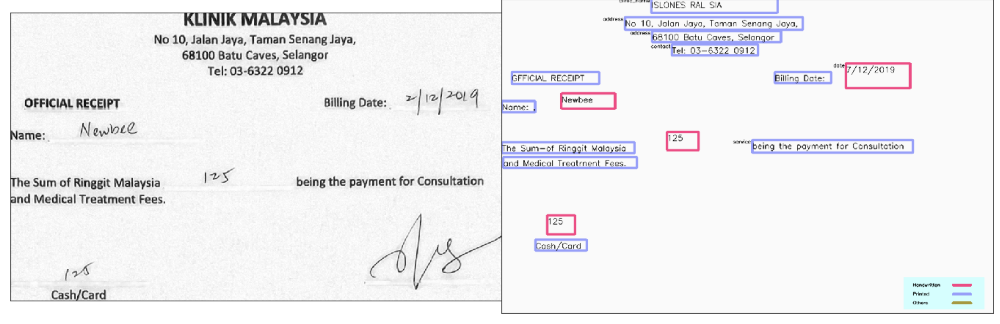

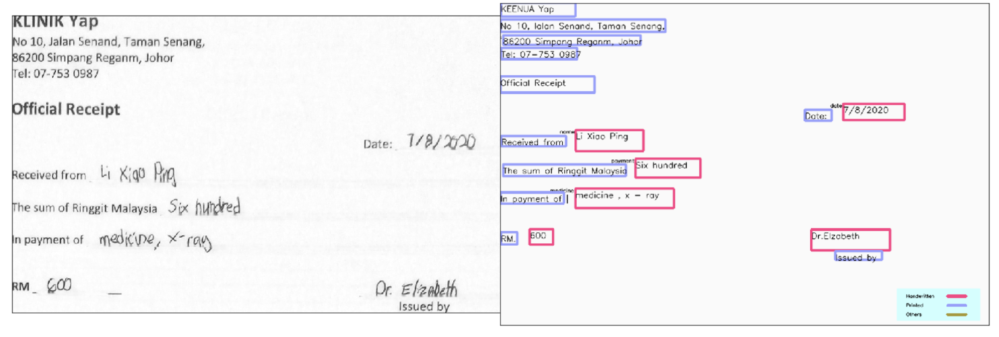

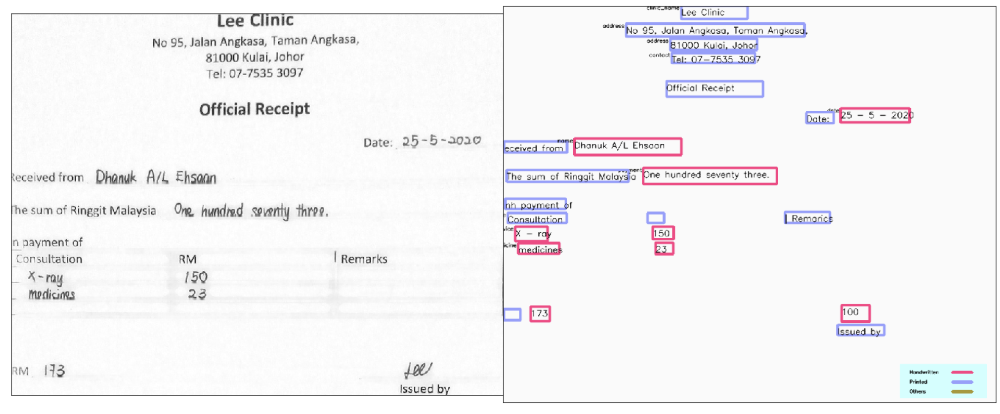

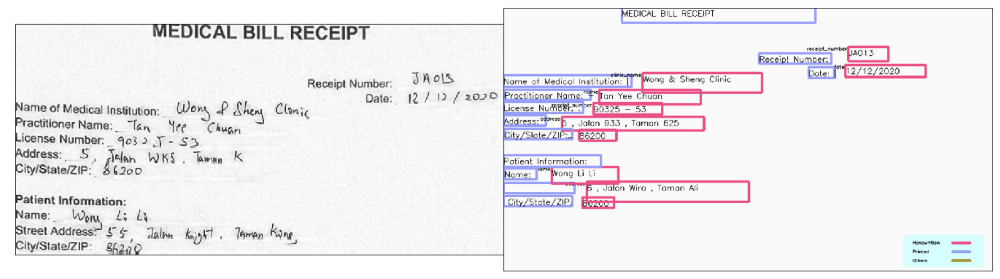

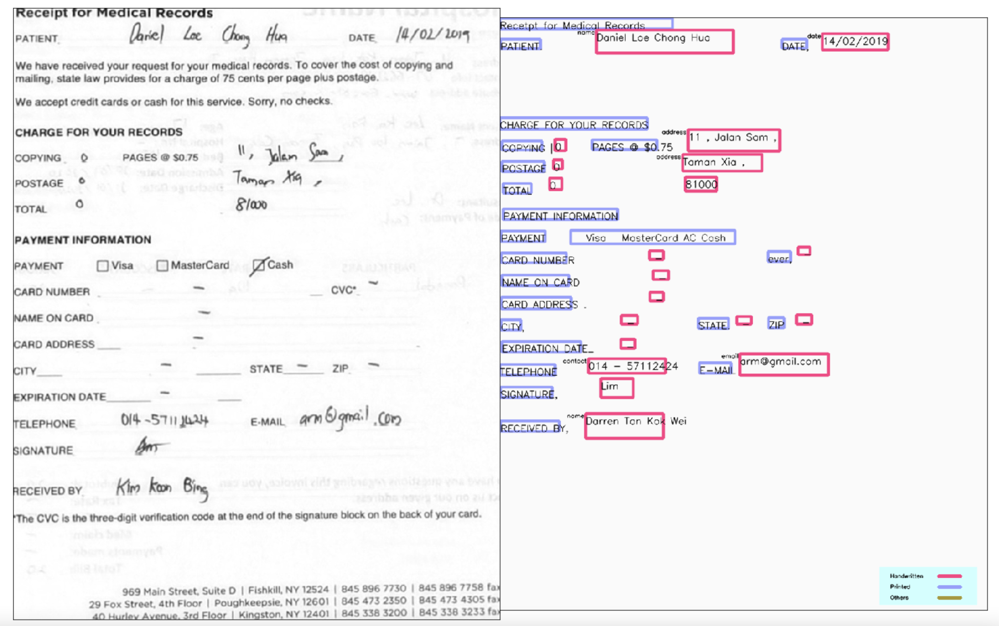

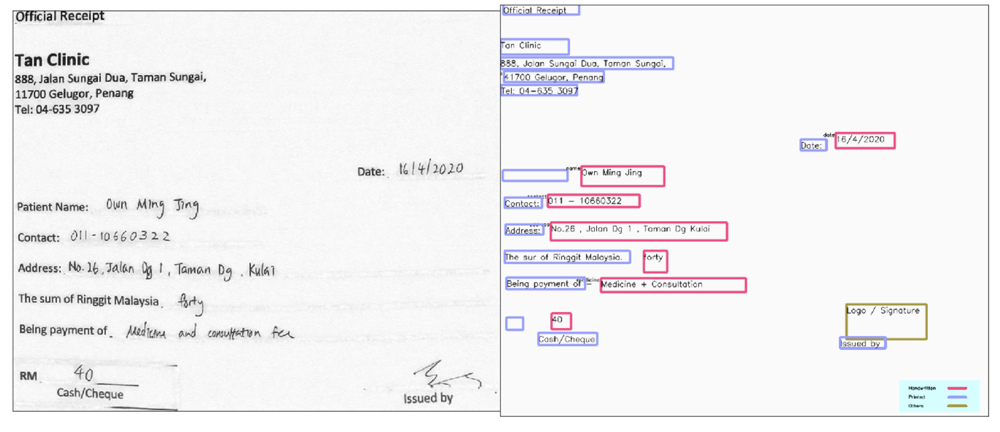

In [38]:
model

HCR(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0)

In [40]:
from pytorch_model_summary import summary

print(summary(model, imgs.float(),labels_y.long()[:,:-1],show_input=True, max_depth=2, show_parent_layers=True))

-----------------------------------------------------------------------------------------------------------------
            Parent Layers             Layer (type)                    Input Shape         Param #     Tr. Param #
               HCR/ResNet                 Conv2d-1                [1, 3, 30, 375]           9,408           9,408
               HCR/ResNet            BatchNorm2d-2               [1, 64, 15, 188]             128             128
               HCR/ResNet                   ReLU-3               [1, 64, 15, 188]               0               0
               HCR/ResNet              MaxPool2d-4               [1, 64, 15, 188]               0               0
               HCR/ResNet             Bottleneck-5                 [1, 64, 8, 94]          75,008          75,008
               HCR/ResNet             Bottleneck-6                [1, 256, 8, 94]          70,400          70,400
               HCR/ResNet             Bottleneck-7                [1, 256, 8, 94]       

In [35]:
for batch, (imgs, labels_y,) in enumerate(test_loader):
    imgs = imgs.to(device)
    labels_y = labels_y.to(device)

    output = model(imgs.float(),labels_y.long()[:,:-1])

In [ ]:
labels_y.long()[:,:-1].shape

In [ ]:
imgs.float().shape

In [ ]:
labels_y.long()[:,:-1].shape

In [ ]:
from torchviz import make_dot
make_dot(output, params=dict(model.named_parameters())).render('a.png')

In [ ]:
labels_y.shape